# Prostate Slide-seq V2 representation with STEP

This notebook trains STEP jointly on four prostate sections from GEO accession GSE181294 and visualizes the cell-intrinsic and spatially aggregated representations.

**Data source:** Human prostate Slide-seq V2 data from GEO accession [GSE181294](https://www.ncbi.nlm.nih.gov/geo/query/acc.cgi?acc=GSE181294).

## Setup


In [3]:
from pathlib import Path

import anndata as ad
import numpy as np
import pandas as pd
import scanpy as sc

from step import stModel
from step.utils.plotting import spatial_plot

REPO_ROOT = Path.cwd()
if not (REPO_ROOT / "pyproject.toml").exists():
    REPO_ROOT = Path("../..").resolve()
DATA_ROOT = REPO_ROOT / "data" / "slide-seq-tumor"
RESULTS_ROOT = REPO_ROOT / "results" / "slide-seq"
RESULTS_ROOT.mkdir(parents=True, exist_ok=True)

sc.set_figure_params(dpi_save=300, figsize=(6, 4.5))


## Model settings


In [2]:
model_config = dict(
    n_glayers=4,
    max_neighbors=20,
    variational=True,
)

run_config = dict(
    n_iterations=2000,
    graph_batch_size=1,
    beta=1e-2,
    e2e=True,
    contrast=True,
)

## Load sections and cell-type annotations


In [5]:
datasets = [
    "Benign04_slide_seq.h5ad",
    "Tumor08_slide_seq.h5ad",
    "Tumor02_slide_seq.h5ad",
    "HP1_slide_seq.h5ad",
]

adatas = {}
for dataset in datasets:
    section = sc.read_h5ad(DATA_ROOT / dataset)
    section.obs_names_make_unique()
    section.var_names_make_unique()
    adatas[dataset.split("_")[0]] = section

adata = ad.concat(adatas, label="sample")
adata.obs[["x", "y"]] = adata.obsm["spatial"].values


In [6]:
cell_anno = pd.read_csv(DATA_ROOT / "slideseq_ano.csv", index_col=0)
cell_anno.head()


,cell1,cell2
HP1_TGCGGTGTCCCTGT,Epithelial,Epithelial_Luminal
HP1_ACTTGACGGTAATA,Epithelial,Epithelial_Luminal
HP1_AACGCMCTCACGTT,Epithelial,Epithelial_Luminal
HP1_CCCTTCAGGGCGTS,Epithelial,Epithelial_Luminal
HP1_TCCAACGGCCGTCC,Epithelial,Epithelial_Luminal


In [7]:
adata.obs[cell_anno.columns] = cell_anno.loc[adata.obs_names]
adata.obs.head()

,sample,x,y,cell1,cell2
Benign04_TATTCCAACCCACT,Benign04,4817.7,1815.60,Tumor,Tumor
Benign04_CGTACTGCATTGGC,Benign04,4754.4,2315.90,Tumor,Tumor
Benign04_TCCGCGGTTCCATG,Benign04,1616.9,2436.90,Tumor,Tumor
Benign04_TGCCAATCTTTTCC,Benign04,4128.8,4793.70,Epithelial,Epithelial_Luminal
Benign04_CAAGCCGAATGCCT,Benign04,3945.6,918.64,Tumor,Tumor


## Train STEP and identify spatial domains


In [8]:
stepc = stModel(
    adata=adata,
    n_top_genes=2000,
    batch_key='sample',
    filtered=True,
    log_transformed=True,
    coord_keys=['x', 'y'],
    decoder_type='zinb',
    edge_clip=None,
    dispersion='gene',
    **model_config,
)


Trying seurat_v3 for hvgs
Adding count data to layer 'counts'
Dataset Done
================Dataset Info================
Batch key: sample 
Class key: None 
Number of Batches: 4 
Number of Classes: None 
Gene Expr: (92932, 2000)
Batch Label: (92932,)


In [10]:
stepc.run(**run_config)
adata = stepc.adata

Training with e2e pattern
Training graph with multiple batches
Constructing graph for batch Benign04
Constructing neighbor graph via kNN style: k = 20
Constructing graph for batch Tumor08
Constructing neighbor graph via kNN style: k = 20
Constructing graph for batch Tumor02
Constructing neighbor graph via kNN style: k = 20
Constructing graph for batch HP1
Constructing neighbor graph via kNN style: k = 20
100%|██████████| 2000/2000 [25:05<00:00,  1.33step/s, recon_loss=381.152, kl_loss=1.001, contrast_loss=4.835, graph_ids=[2]]
Constructing neighbor graph via kNN style: k = 20
Constructing neighbor graph via kNN style: k = 20
Constructing neighbor graph via kNN style: k = 20
Constructing neighbor graph via kNN style: k = 20


In [11]:
stepc.cluster(adata, use_rep='X_smoothed', n_clusters=5,)

In [12]:
stepc.adata.obsm['spatial'] = stepc.adata.obsm['spatial'].values

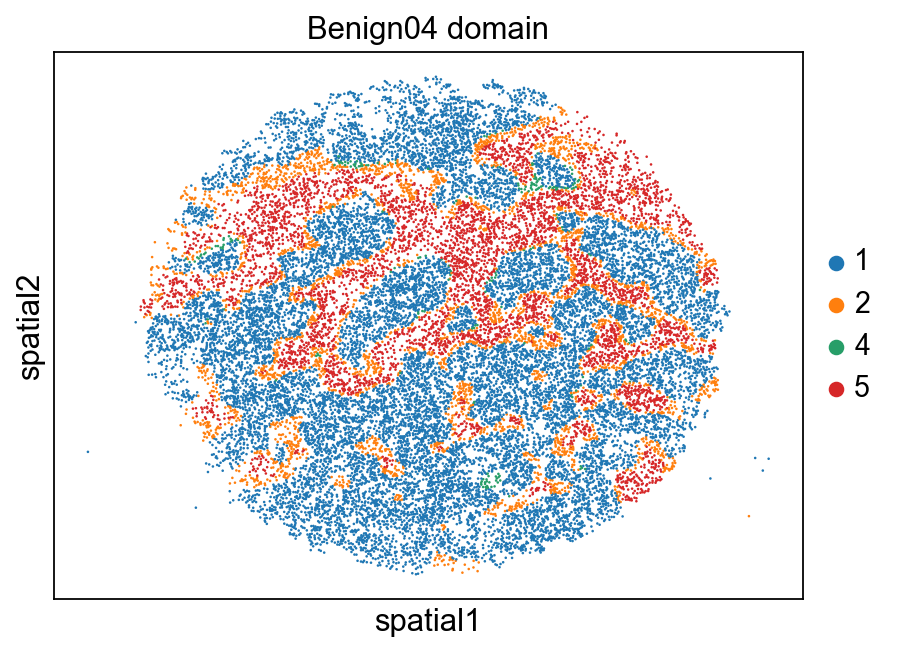

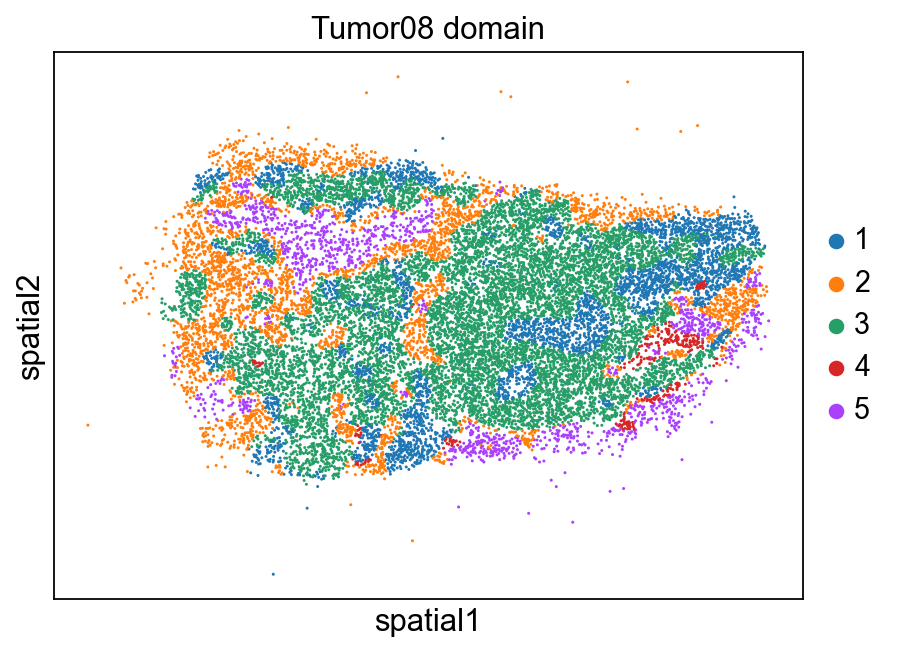

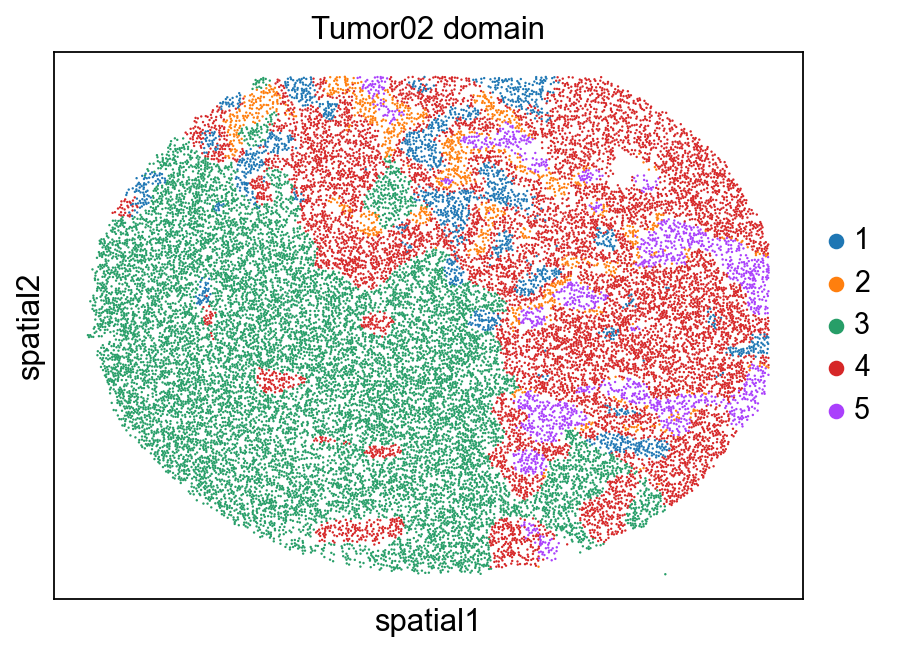

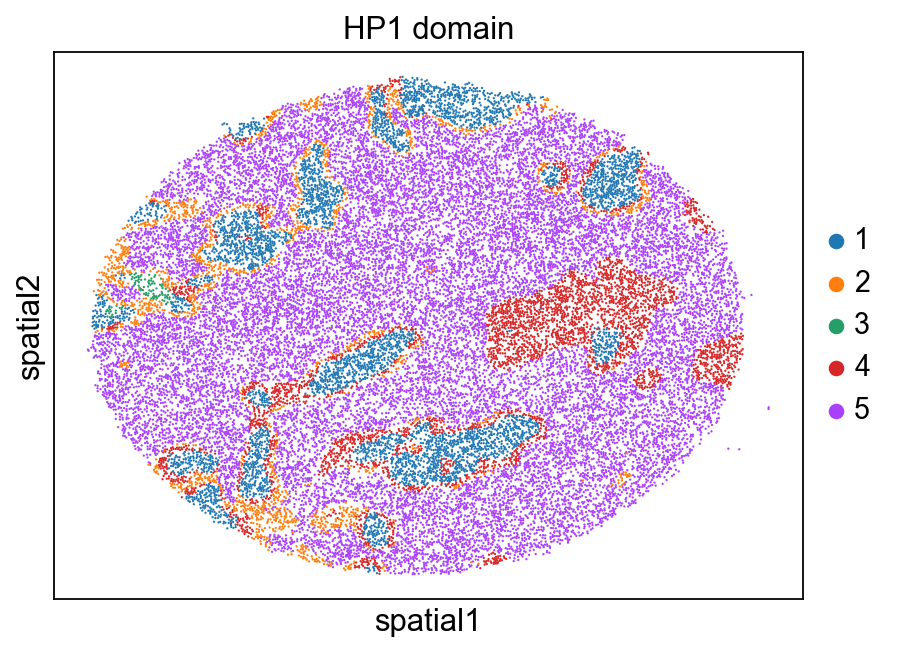

[None, None, None, None]

In [13]:
stepc.spatial_plot(color='domain', with_images=False)

## Compare cell-intrinsic and spatial representations


In [14]:
stepc.add_embed(key_added='X_rep')

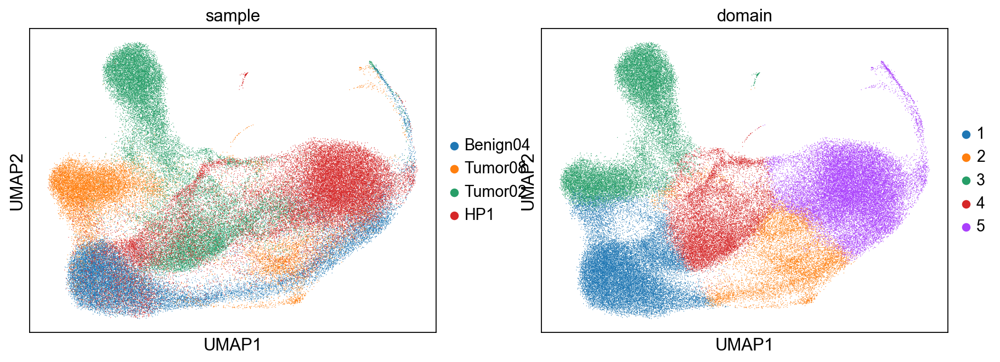

In [15]:
sc.pp.neighbors(stepc.adata, use_rep='X_smoothed')
sc.tl.umap(adata)
sc.pl.umap(adata, color=['sample', 'domain'])

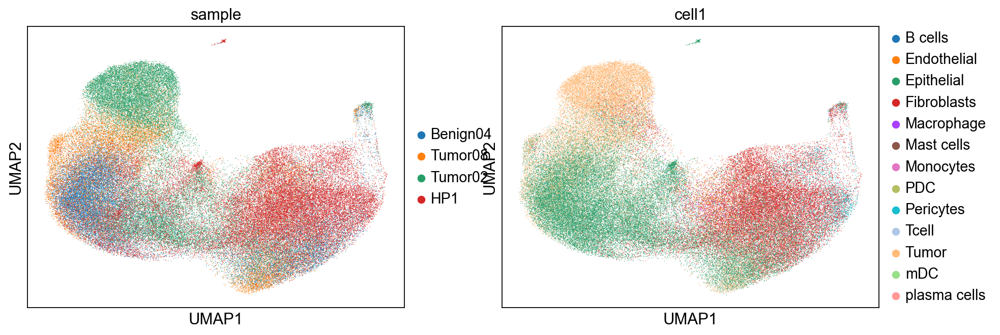

In [16]:
sc.pp.neighbors(stepc.adata, use_rep='X_rep')
sc.tl.umap(adata)
sc.pl.umap(adata, color=['sample', 'cell1'])

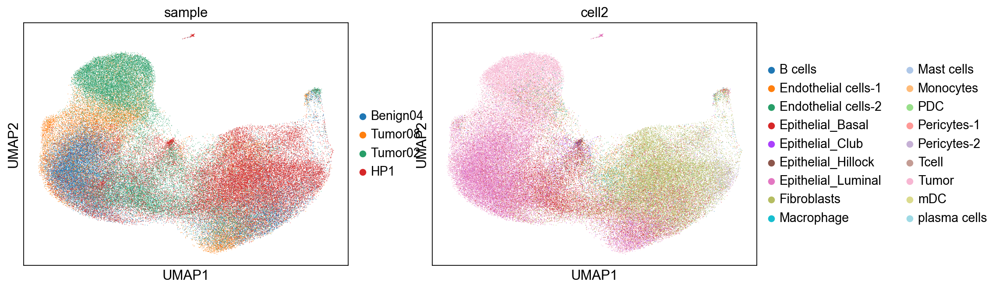

In [17]:
sc.pl.umap(adata, color=['sample', 'cell2'])

## Spatial coherence and domain labels


In [9]:
from sklearn.metrics.pairwise import cosine_similarity

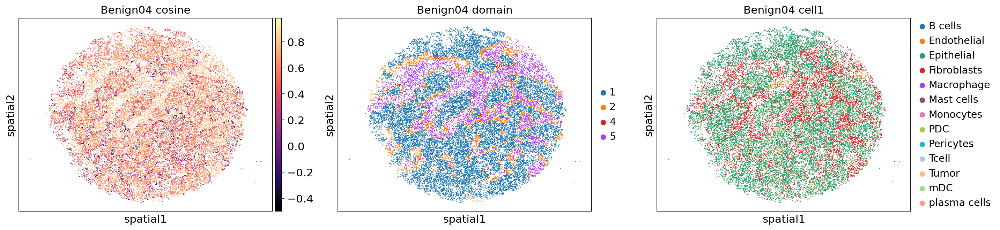

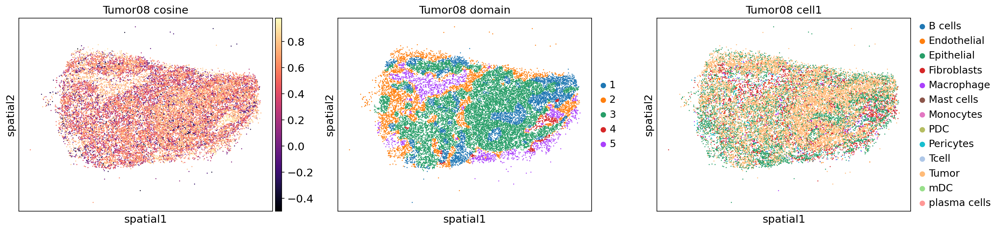

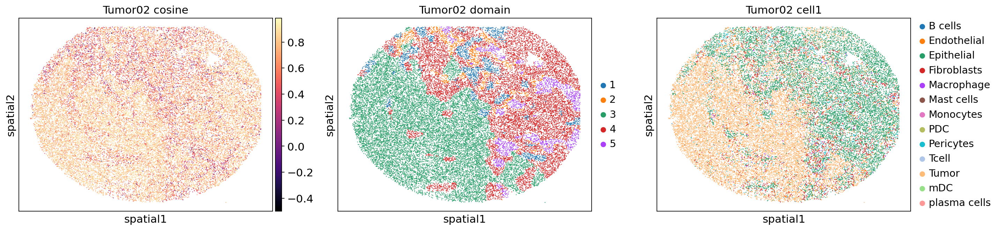

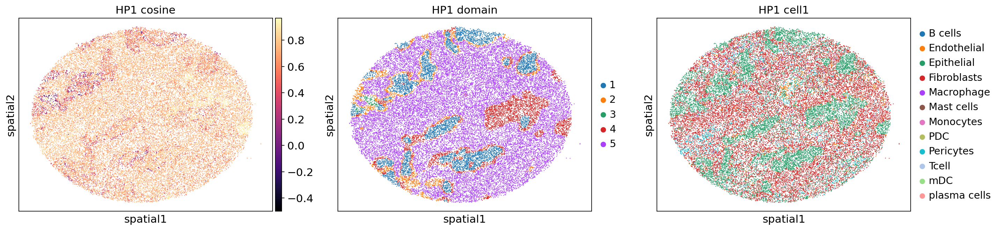

[None, None, None, None]

In [12]:
adata.obs['cosine'] = np.diag(cosine_similarity(
    adata.obsm['X_rep'],
    adata.obsm['X_smoothed'],
))
spatial_plot(adata, color=['cosine', 'domain', 'cell1',], batch_key='sample', with_images=False, cmap='magma', vmin=-0.5)

In [13]:
zonation = {
    '1': 'Epi',
    '2': 'Boundary',
    '3': 'Tumor',
    '4': 'Epi2',
    '5': 'Fibro'
}

In [14]:
adata.obs['zonation'] = adata.obs['domain'].map(zonation)

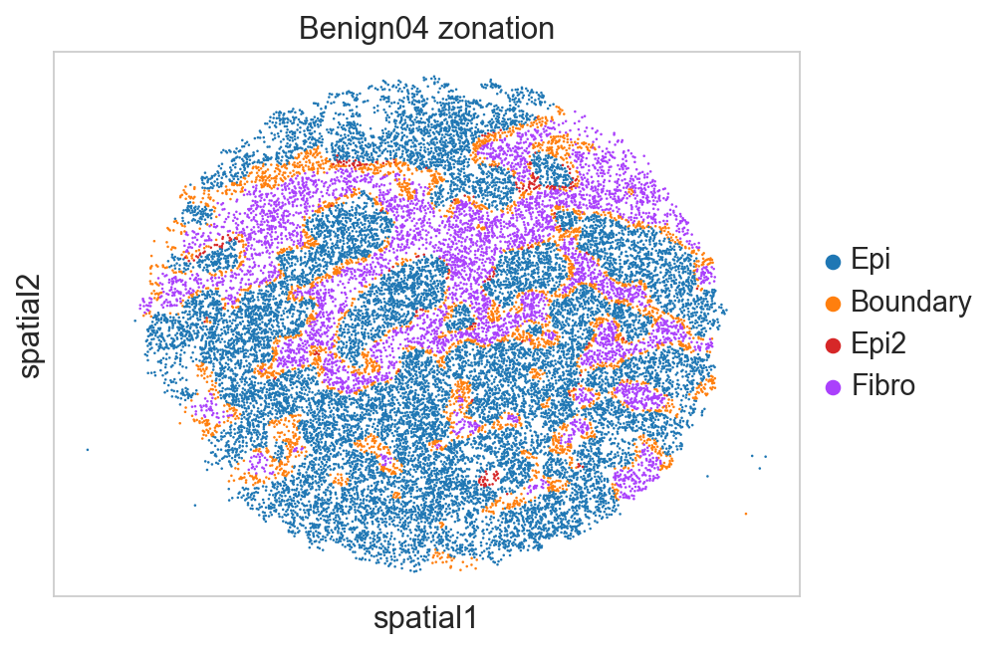

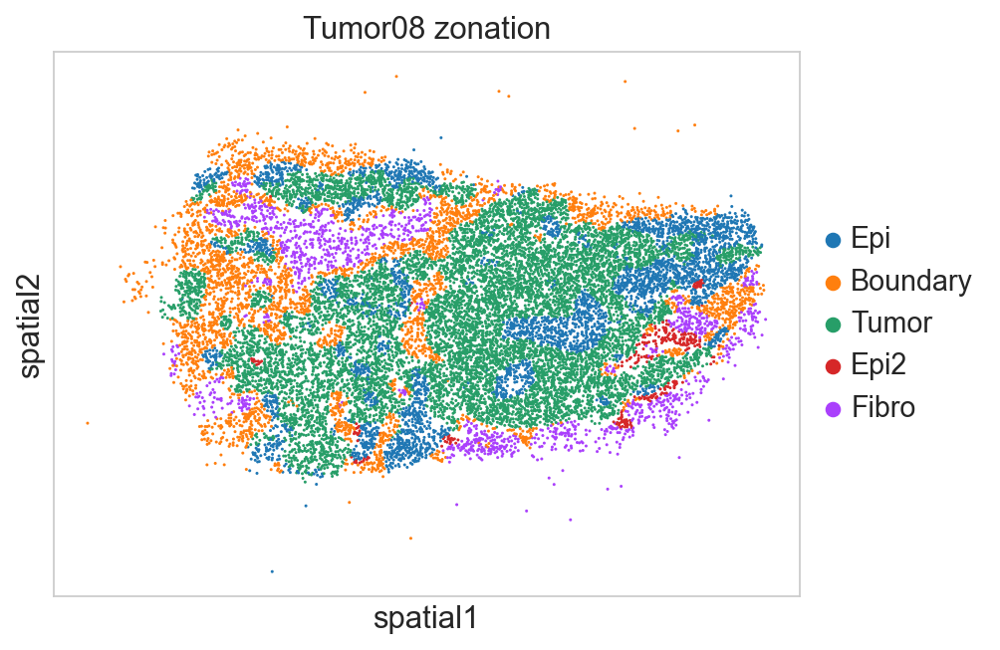

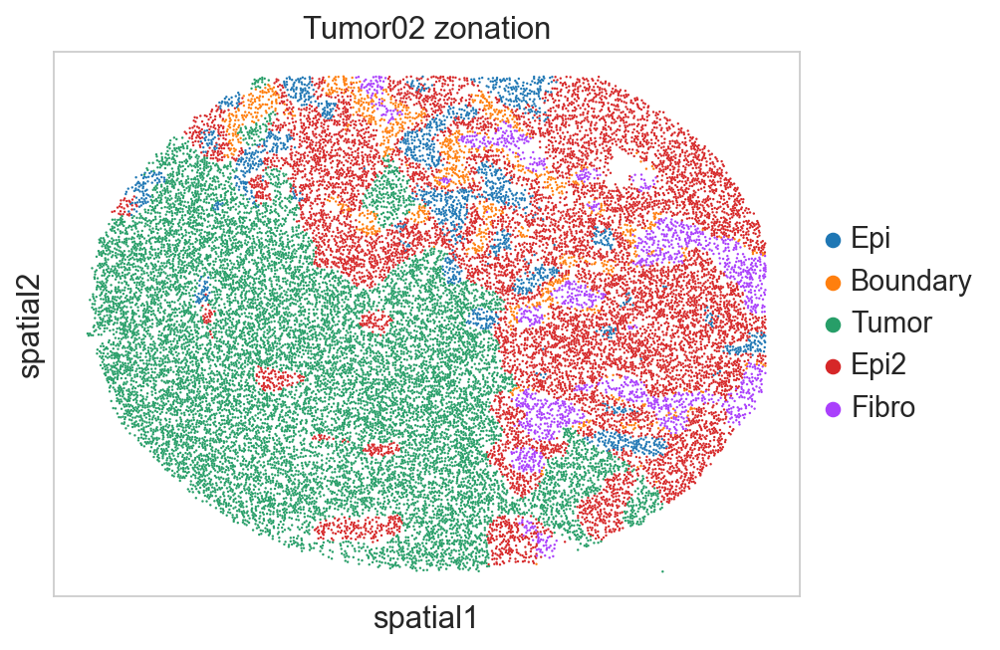

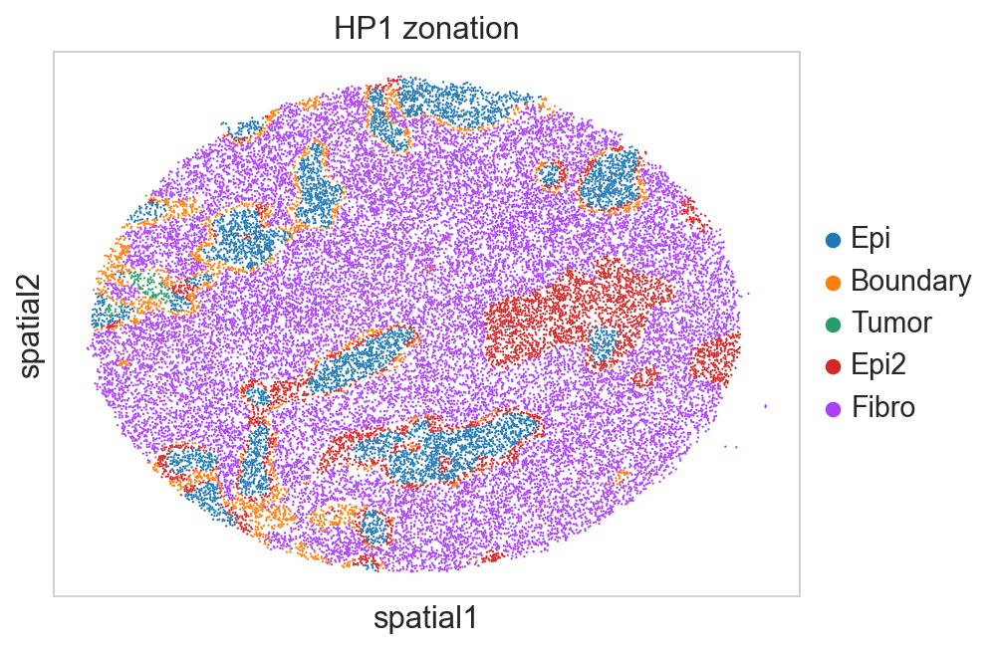

[None, None, None, None]

In [270]:
spatial_plot(adata, color=['zonation'], batch_key='sample', with_images=False, cmap='magma', ncols=2)

## Save the fitted representation


In [19]:
stepc.save(RESULTS_ROOT / "config")
stepc.adata.write_h5ad(RESULTS_ROOT / "prostate_slideseq_step.h5ad")


Saving model...
Saving model config...
Saving dataset config...
